<a href="https://colab.research.google.com/github/JKD711/Challenge-Alura-Store/blob/main/AluraStoreLatam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 📊 Informe Final – Recomendación de Venta para Alura Store

## 🧾 Introducción

El Sr. Juan, propietario de la cadena **Alura Store**, está considerando iniciar un nuevo emprendimiento. Para ello, ha decidido vender una de sus cuatro tiendas. Este informe tiene como propósito analizar el desempeño de cada tienda y determinar cuál de ellas sería la mejor candidata para ser vendida, basándonos en los siguientes criterios:

- Facturación total
- Promedio de ingreso por venta
- Ventas por categoría
- Calificación promedio de clientes
- Productos más y menos vendidos
- Costo de envío promedio

Los análisis y visualizaciones realizadas nos permitirán tomar una decisión fundamentada.

---

### Importación de datos



In [ ]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


# 📈 Desarrollo del Análisis

##💰1. Análisis de facturación



In [ ]:
suma_tienda1 = tienda["Precio"].sum()
suma_tienda2 = tienda2["Precio"].sum()
suma_tienda3 = tienda3["Precio"].sum()
suma_tienda4 = tienda4["Precio"].sum()

# Facturación total de cada una de las tiendas
print(f'Facturación Tienda 1: ${suma_tienda1:.2f}')
print(f'Facturación Tienda 2: ${suma_tienda2:.2f}')
print(f'Facturación Tienda 3: ${suma_tienda3:.2f}')
print(f'Facturación Tienda 4: ${suma_tienda4:.2f}')

# Facturación total de todas las tiendas
facturacion_total = suma_tienda1 + suma_tienda2 + suma_tienda3 + suma_tienda4
print(f"\nFacturación total de todas las tiendas: ${facturacion_total:.2f}")

Facturación Tienda 1: $1150880400.00
Facturación Tienda 2: $1116343500.00
Facturación Tienda 3: $1098019600.00
Facturación Tienda 4: $1038375700.00

Facturación total de todas las tiendas: $4403619200.00


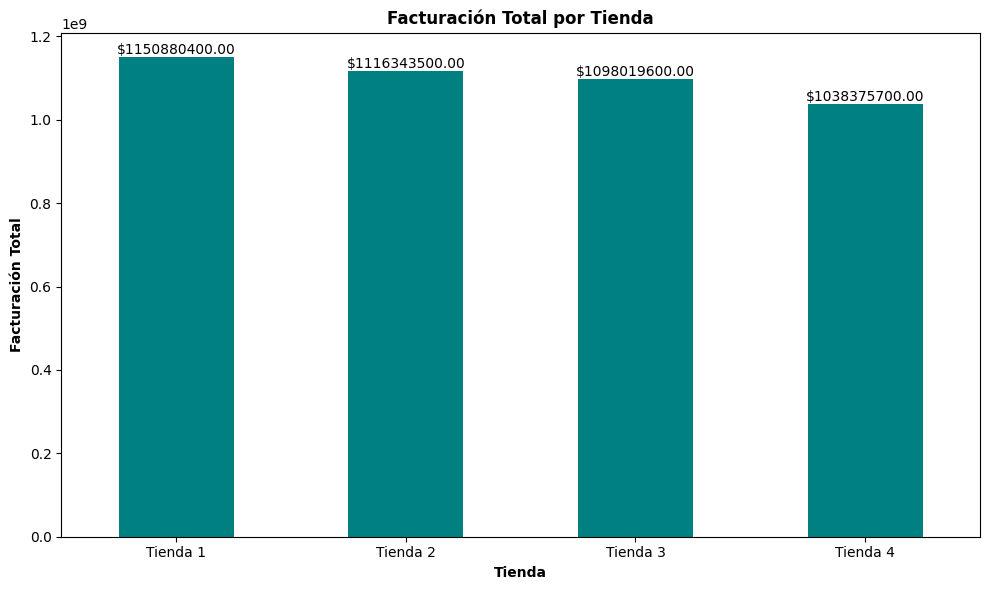

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

facturacion_por_tienda = {
    'Tienda 1': suma_tienda1,
    'Tienda 2': suma_tienda2,
    'Tienda 3': suma_tienda3,
    'Tienda 4': suma_tienda4
}

facturacion_series = pd.Series(facturacion_por_tienda)

plt.figure(figsize=(10, 6))
facturacion_series.plot(kind='bar', color='teal')

plt.xlabel('Tienda', fontweight='bold')
plt.ylabel('Facturación Total', fontweight='bold')
plt.title('Facturación Total por Tienda', fontweight='bold')
plt.xticks(rotation=0)

for index, value in enumerate(facturacion_series):
    plt.text(index, value, f"${value:.2f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()

**CONCLUSION**

🔎 La Tienda 4 presenta la facturación más baja, representando menos del 24% del total global.


##📦2. Ventas por categoría

In [ ]:
# Combina los DataFrames de las cuatro tiendas
Tiendas = pd.concat([tienda.assign(Tienda='Tienda 1'),
                       tienda2.assign(Tienda='Tienda 2'),
                       tienda3.assign(Tienda='Tienda 3'),
                       tienda4.assign(Tienda='Tienda 4')])

# Agrupar por tienda y categoría, y calcular el número de ventas y el valor total de ventas
analisis_ventas = Tiendas.groupby(['Tienda', 'Categoría del Producto']).agg(
    Numero_de_Ventas=('Producto', 'size'),
    Valor_Total_de_Ventas=('Precio', 'sum')
).reset_index()

# Ordenar los resultados
analisis_ventas_ordenado = analisis_ventas.sort_values(by=['Tienda', 'Numero_de_Ventas'], ascending=[True, False])

# Imprimir los resultados para cada tienda
for nombre_tienda in analisis_ventas_ordenado ['Tienda'].unique():
    print(f"\nVentas por categoría en {nombre_tienda }")
    tienda_data = analisis_ventas_ordenado [analisis_ventas_ordenado ['Tienda'] == nombre_tienda]
    print(tienda_data[['Categoría del Producto', 'Numero_de_Ventas', 'Valor_Total_de_Ventas']].to_string(index=False))

# Mostrar resultados totales
analisis_ventas_total = Tiendas.groupby(['Categoría del Producto']).agg(
    Numero_de_Ventas_Total=('Producto', 'size'),
    Valor_Total_de_Ventas=('Precio', 'sum')
).reset_index()

analisis_ventas_total_ordenado = analisis_ventas_total.sort_values(by='Numero_de_Ventas_Total', ascending=False)

print("\nCantidad total de ventas por categoría (todas las tiendas):")
print(analisis_ventas_total_ordenado.to_string(index=False))


Ventas por categoría en Tienda 1
 Categoría del Producto  Numero_de_Ventas  Valor_Total_de_Ventas
                Muebles               465            187633700.0
           Electrónicos               448            429493500.0
               Juguetes               324             17995700.0
      Electrodomésticos               312            363685200.0
   Deportes y diversión               284             39290000.0
 Instrumentos musicales               182             91299000.0
                 Libros               173              8784900.0
Artículos para el hogar               171             12698400.0

Ventas por categoría en Tienda 2
 Categoría del Producto  Numero_de_Ventas  Valor_Total_de_Ventas
                Muebles               442            176426300.0
           Electrónicos               422            410831100.0
               Juguetes               313             15945400.0
      Electrodomésticos               305            348567800.0
   Deportes y diversió

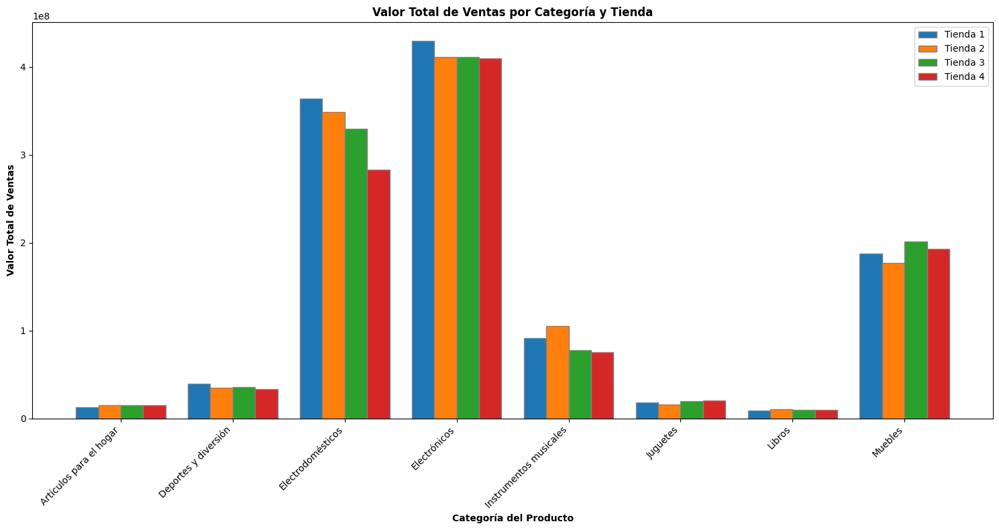

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Obtencion de las categorias y tiendas
categorias = analisis_ventas['Categoría del Producto'].unique()
tiendas = analisis_ventas['Tienda'].unique()

# Establecer el ancho de las barras
bar_width = 0.2

# Establecer las posiciones de las barras en el eje X
r = np.arange(len(categorias))

# Crear la grafica de barras agrupadas
plt.figure(figsize=(15, 8))

for i, store in enumerate(tiendas):
    store_data = analisis_ventas[analisis_ventas['Tienda'] == store]
    # Verificacion que los datos estén alineados con las categorías
    store_data = store_data.set_index('Categoría del Producto').reindex(categorias).reset_index()
    plt.bar(r + i * bar_width, store_data['Valor_Total_de_Ventas'], color=f'C{i}', width=bar_width, edgecolor='grey', label=store)

# Agregar etiquetas y título
plt.xlabel('Categoría del Producto', fontweight='bold')
plt.ylabel('Valor Total de Ventas', fontweight='bold')
plt.title('Valor Total de Ventas por Categoría y Tienda', fontweight='bold')
plt.xticks(r + bar_width * (len(tiendas) - 1) / 2, categorias, rotation=45, ha='right')

# Agregar leyenda
plt.legend()

# Ajustar el diseño para evitar que las etiquetas se superpongan
plt.tight_layout()

# Mostrar el resultado
plt.show()

**CONCLUSION:**

Se observan diferencias en el número de ventas y el valor generado por categoría.

Algunas observaciones destacadas son:

* La Tienda 4 tiene los niveles más bajos en electrodomésticos y muebles, categorías de alta facturación en las otras tiendas.

* Aunque se mantiene competitiva en electrónicos, no lidera en ninguna categoría principal.

🔎 La Tienda 4 muestra una menor participación relativa en las categorías más rentables.

##🌟3. Calificación promedio de la tienda


In [ ]:
def clasificacion_promedio(tienda, numero):
    promedio = tienda['Calificación'].mean()
    print(f"Clasificación promedio en Tienda {numero}: {promedio:.2f}")

# Mostrar resultados para cada tienda
clasificacion_promedio(tienda, 1)
clasificacion_promedio(tienda2, 2)
clasificacion_promedio(tienda3, 3)
clasificacion_promedio(tienda4, 4)

Clasificación promedio en Tienda 1: 3.98
Clasificación promedio en Tienda 2: 4.04
Clasificación promedio en Tienda 3: 4.05
Clasificación promedio en Tienda 4: 4.00


In [ ]:
# Calcular la calificación promedio para cada tienda
calificacion_promedio_tienda = Tiendas.groupby('Tienda')['Calificación'].mean().reset_index()

# Renombrar la columna de calificación promedio
calificacion_promedio_tienda.rename(columns={'Calificación': 'Calificación Promedio'}, inplace=True)

# Imprimir la calificación promedio de cada tienda
print("\nCalificación promedio de clientes por tienda:")
print(calificacion_promedio_tienda)

#Promedio General
overall_average_rating = Tiendas['Calificación'].mean()
print(f"\nCalificación promedio general de clientes (Todas las tiendas): {overall_average_rating:.2f}")


Calificación promedio de clientes por tienda:
     Tienda  Calificación Promedio
0  Tienda 1               3.976685
1  Tienda 2               4.037304
2  Tienda 3               4.048326
3  Tienda 4               3.995759

Calificación promedio general de clientes (Todas las tiendas): 4.01


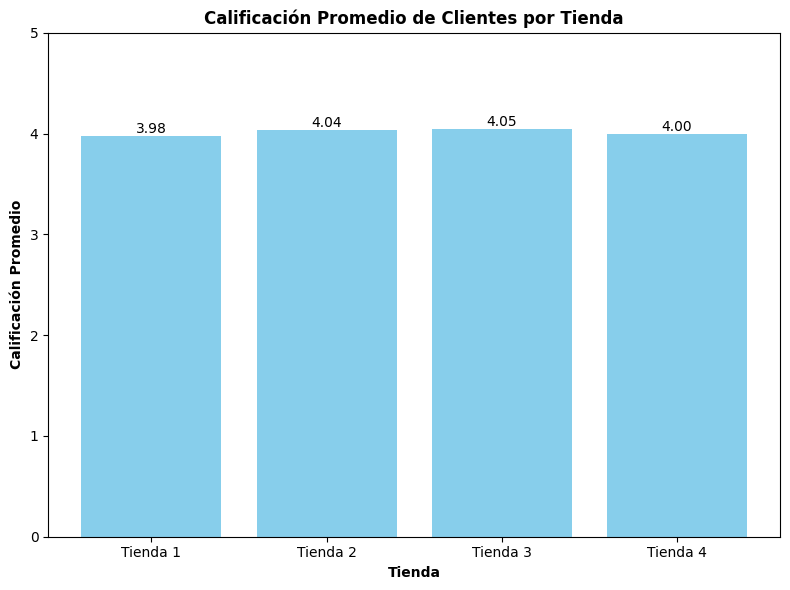

In [ ]:
import matplotlib.pyplot as plt

# Crear la tabla de barras
plt.figure(figsize=(8, 6))
plt.bar(calificacion_promedio_tienda['Tienda'], calificacion_promedio_tienda['Calificación Promedio'], color='skyblue')

# Agregar etiquetas y título
plt.xlabel('Tienda', fontweight='bold')
plt.ylabel('Calificación Promedio', fontweight='bold')
plt.title('Calificación Promedio de Clientes por Tienda', fontweight='bold')
plt.ylim(0, 5) # Establecer el límite del eje Y de 0 a 5 para las calificaciones

# Agregar el valor de calificación promedio en la parte superior de cada barra
for index, row in calificacion_promedio_tienda.iterrows():
    plt.text(row['Tienda'], row['Calificación Promedio'], f"{row['Calificación Promedio']:.2f}", ha='center', va='bottom')

# Mostrar resultado
plt.tight_layout()
plt.show()

**CONCLUSION**

🔎 Aunque la Tienda 4 supera a la Tienda 1, no destaca en la percepción de los clientes y se ubica por debajo del promedio general.

## 🛒4. Productos más y menos vendidos

In [ ]:
# Función para encontrar los productos más y menos vendidos por tienda
def analizar_productos_vendidos(df, nombre_tienda):
  # Agrupar por producto y calcular el número de ventas y el valor total de ventas
  productos_ventas = df.groupby('Producto').agg(
      Numero_de_Ventas=('Producto', 'size'),
      Valor_Total_de_Ventas=('Precio', 'sum')
  ).reset_index()

  # Ordenar por número de ventas para encontrar los más y menos vendidos
  productos_mas_vendidos = productos_ventas.sort_values(by='Numero_de_Ventas', ascending=False)
  productos_menos_vendidos = productos_ventas.sort_values(by='Numero_de_Ventas', ascending=True)

  # Ordenar por valor total de ventas para encontrar los que generaron más y menos dinero
  productos_mas_dinero = productos_ventas.sort_values(by='Valor_Total_de_Ventas', ascending=False)
  productos_menos_dinero = productos_ventas.sort_values(by='Valor_Total_de_Ventas', ascending=True)


  print(f"\n--- Análisis de productos en {nombre_tienda} ---")

  print("\nTOP 3 Productos que MÁS ventas tuvieron:")
  print(productos_mas_vendidos.head(3).to_string(index=False))

  print("\nTOP 3 Productos que MENOS ventas tuvieron:")
  print(productos_menos_vendidos.head(3).to_string(index=False))

  print("\nTOP 3 Productos que MÁS dinero generaron:")
  print(productos_mas_dinero.head(3).to_string(index=False))

  print("\nTOP 3 Productos que MENOS dinero generaron:")
  print(productos_menos_dinero.head(3).to_string(index=False))


# Analizar productos para cada tienda
analizar_productos_vendidos(tienda, 'Tienda 1')
analizar_productos_vendidos(tienda2, 'Tienda 2')
analizar_productos_vendidos(tienda3, 'Tienda 3')
analizar_productos_vendidos(tienda4, 'Tienda 4')



--- Análisis de productos en Tienda 1 ---

TOP 3 Productos que MÁS ventas tuvieron:
     Producto  Numero_de_Ventas  Valor_Total_de_Ventas
      Armario                60             29462300.0
TV LED UHD 4K                60            142150200.0
   Microondas                60             34761500.0

TOP 3 Productos que MENOS ventas tuvieron:
                 Producto  Numero_de_Ventas  Valor_Total_de_Ventas
Auriculares con micrófono                33              4730800.0
             Celular ABXY                33             32651000.0
          Olla de presión                35              2629300.0

TOP 3 Productos que MÁS dinero generaron:
     Producto  Numero_de_Ventas  Valor_Total_de_Ventas
TV LED UHD 4K                60            142150200.0
 Refrigerador                54            112143300.0
    Iphone 15                49             97902200.0

TOP 3 Productos que MENOS dinero generaron:
          Producto  Numero_de_Ventas  Valor_Total_de_Ventas
Cuerda para sal

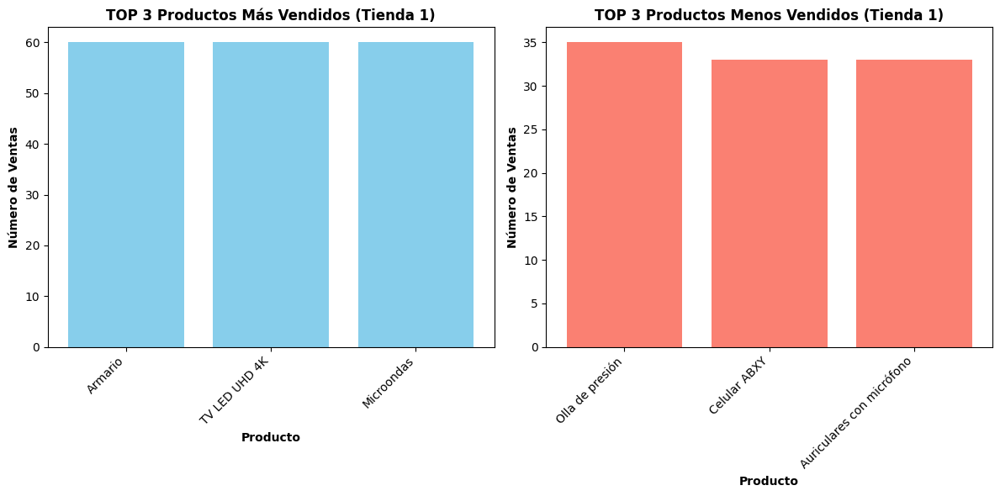

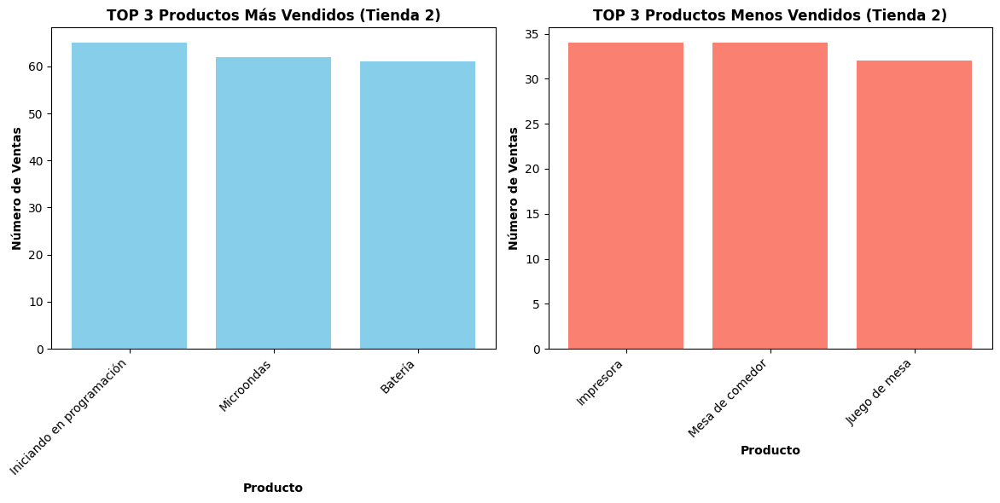

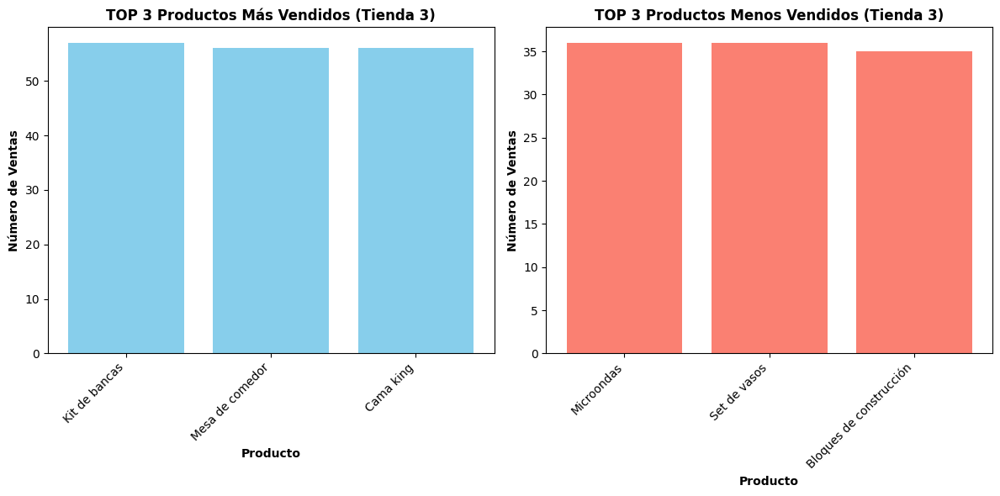

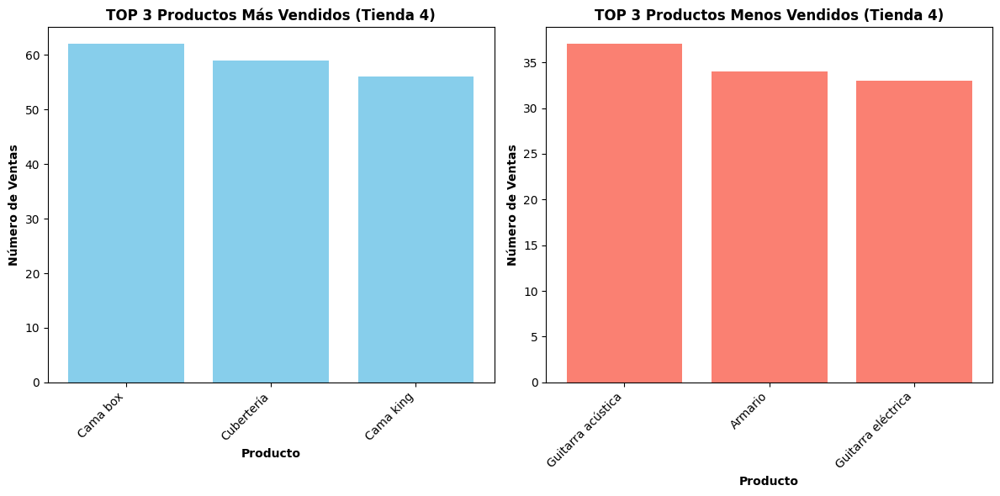

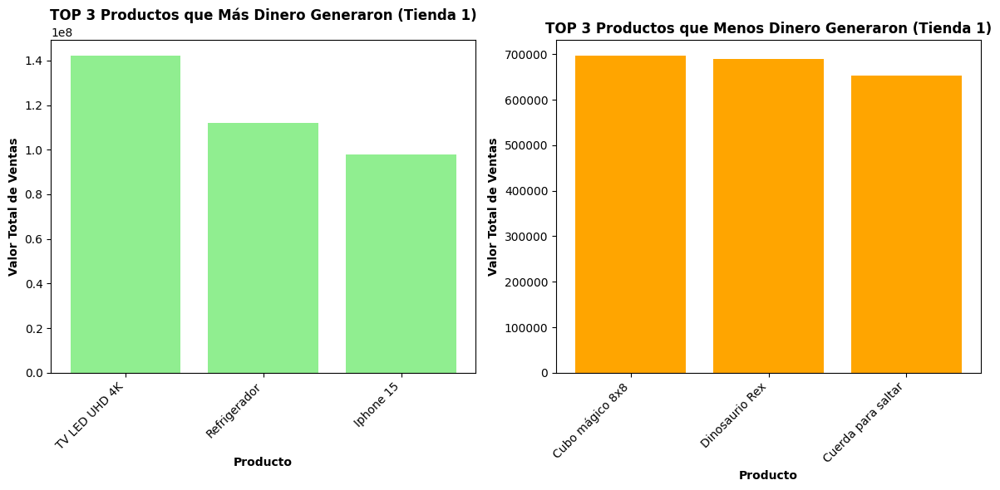

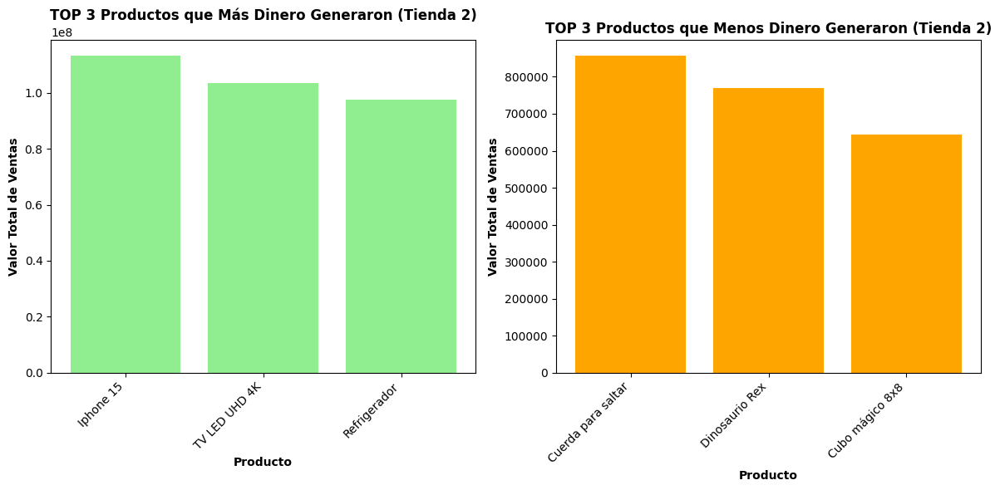

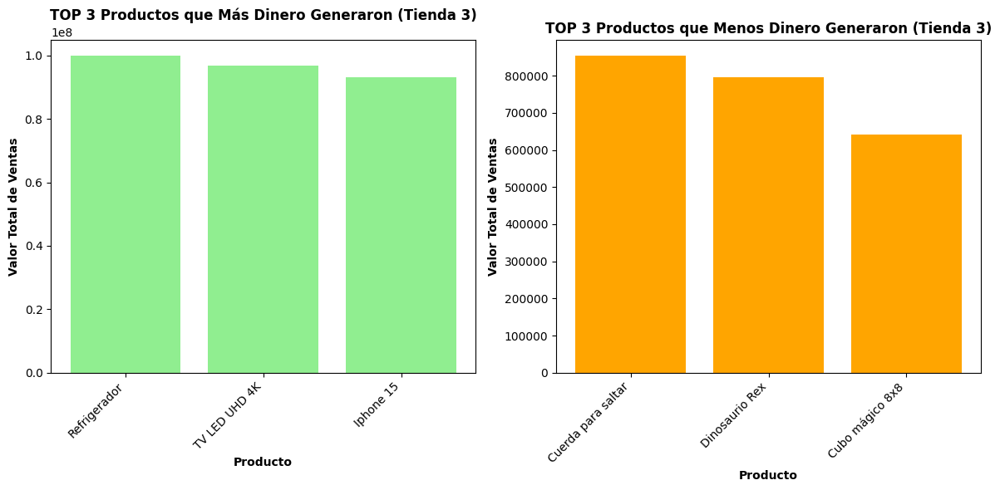

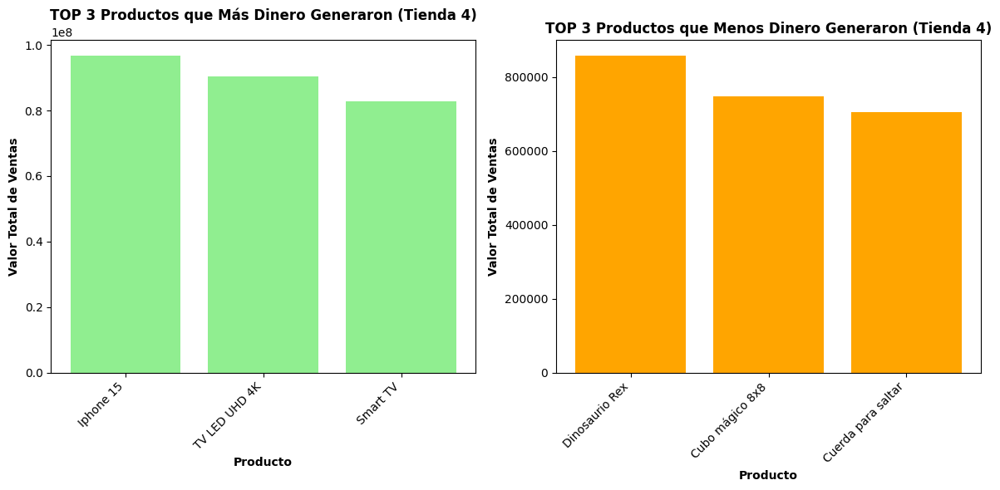

In [ ]:
# Visualización de productos más y menos vendidos por número de ventas (TOP 3)
for i, df in enumerate([tienda, tienda2, tienda3, tienda4]):
  productos_ventas = df.groupby('Producto').size().reset_index(name='Numero_de_Ventas')
  productos_ventas_ordenado = productos_ventas.sort_values(by='Numero_de_Ventas', ascending=False)

  plt.figure(figsize=(12, 6))

  plt.subplot(1, 2, 1)
  plt.bar(productos_ventas_ordenado.head(3)['Producto'], productos_ventas_ordenado.head(3)['Numero_de_Ventas'], color='skyblue')
  plt.title(f'TOP 3 Productos Más Vendidos (Tienda {i+1})', fontweight='bold')
  plt.xlabel('Producto', fontweight='bold')
  plt.ylabel('Número de Ventas', fontweight='bold')
  plt.xticks(rotation=45, ha='right')

  plt.subplot(1, 2, 2)
  plt.bar(productos_ventas_ordenado.tail(3)['Producto'], productos_ventas_ordenado.tail(3)['Numero_de_Ventas'], color='salmon')
  plt.title(f'TOP 3 Productos Menos Vendidos (Tienda {i+1})', fontweight='bold')
  plt.xlabel('Producto', fontweight='bold')
  plt.ylabel('Número de Ventas', fontweight='bold')
  plt.xticks(rotation=45, ha='right')

  plt.tight_layout()
  plt.show()

# Visualización de productos que generaron más y menos dinero (TOP 3)
for i, df in enumerate([tienda, tienda2, tienda3, tienda4]):
  productos_ingresos = df.groupby('Producto')['Precio'].sum().reset_index(name='Valor_Total_de_Ventas')
  productos_ingresos_ordenado = productos_ingresos.sort_values(by='Valor_Total_de_Ventas', ascending=False)

  plt.figure(figsize=(12, 6))

  plt.subplot(1, 2, 1)
  plt.bar(productos_ingresos_ordenado.head(3)['Producto'], productos_ingresos_ordenado.head(3)['Valor_Total_de_Ventas'], color='lightgreen')
  plt.title(f'TOP 3 Productos que Más Dinero Generaron (Tienda {i+1})', fontweight='bold')
  plt.xlabel('Producto', fontweight='bold')
  plt.ylabel('Valor Total de Ventas', fontweight='bold')
  plt.xticks(rotation=45, ha='right')

  plt.subplot(1, 2, 2)
  plt.bar(productos_ingresos_ordenado.tail(3)['Producto'], productos_ingresos_ordenado.tail(3)['Valor_Total_de_Ventas'], color='orange')
  plt.title(f'TOP 3 Productos que Menos Dinero Generaron (Tienda {i+1})', fontweight='bold')
  plt.xlabel('Producto', fontweight='bold')
  plt.ylabel('Valor Total de Ventas', fontweight='bold')
  plt.xticks(rotation=45, ha='right')

  plt.tight_layout()
  plt.show()

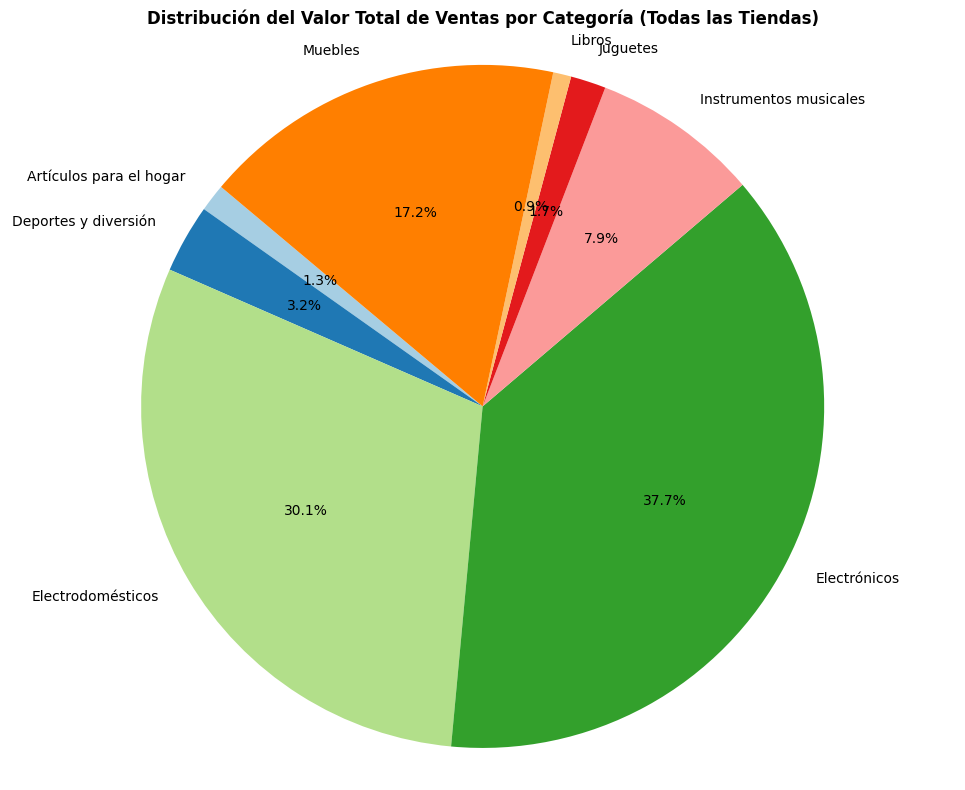

In [ ]:
import matplotlib.pyplot as plt

# Valor total de ventas para cada categoría
category_sales_value = analisis_ventas_total.set_index('Categoría del Producto')['Valor_Total_de_Ventas']

# Crear Torta/Pie: Distribución del total
plt.figure(figsize=(10, 8))
plt.pie(category_sales_value, labels=category_sales_value.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)

# Agregar tiutlo
plt.title('Distribución del Valor Total de Ventas por Categoría (Todas las Tiendas)', fontweight='bold')

# El grafico es redondo(verificacion)
plt.axis('equal')

# Mostar resultado
plt.tight_layout()
plt.show()

**CONCLUSION**

**Tienda 4 – Análisis de Productos:**

* Los productos con más ventas son: Cama box, Cama king, Smart TV.
* Sin embargo, varios productos costosos como guitarras y armarios tienen baja rotación, lo que afecta el flujo de caja.
* Además, los productos que menos dinero generan incluyen artículos que a pesar de tener volumen, no representan ingresos significativos.

🔎 El portafolio de productos en la Tienda 4 carece de balance entre volumen y valor de venta.

##🚚 5. Envío promedio por tienda

In [ ]:
# Calcular el costo de envío promedio para cada tienda
envio_promedio_tienda = Tiendas.groupby('Tienda')['Costo de envío'].mean().reset_index()

# Renombrar la columna
envio_promedio_tienda.rename(columns={'Costo de envío': 'Envío Promedio'}, inplace=True)

# Imprimir el costo de envío promedio de cada tienda
print("\nCosto de envío promedio por tienda:")
print(envio_promedio_tienda)


Costo de envío promedio por tienda:
     Tienda  Envío Promedio
0  Tienda 1    26018.609580
1  Tienda 2    25216.235693
2  Tienda 3    24805.680373
3  Tienda 4    23459.457167


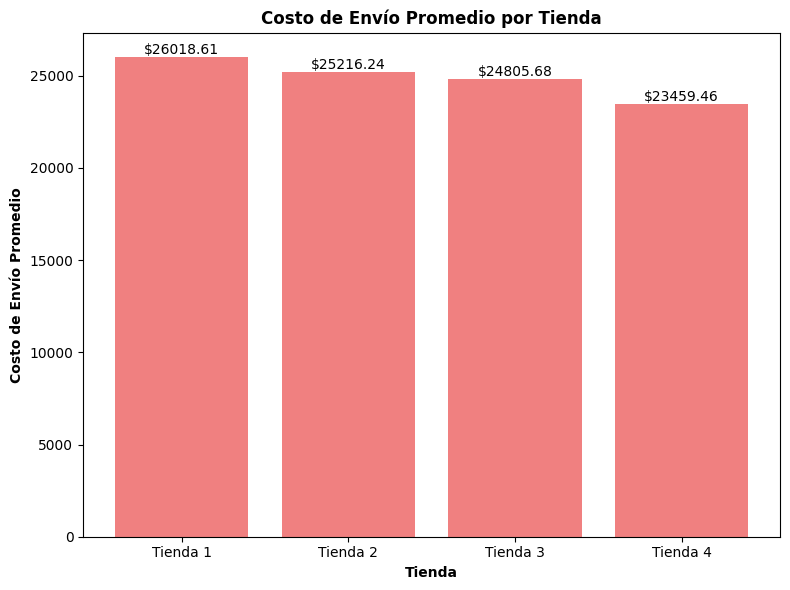

In [ ]:
# Crear la tabla de barras
plt.figure(figsize=(8, 6))
plt.bar(envio_promedio_tienda['Tienda'], envio_promedio_tienda['Envío Promedio'], color='lightcoral')

# Agregar etiquetas y título
plt.xlabel('Tienda', fontweight='bold')
plt.ylabel('Costo de Envío Promedio', fontweight='bold')
plt.title('Costo de Envío Promedio por Tienda', fontweight='bold')

# Agregar el valor del envío promedio en la parte superior de cada barra
for index, row in envio_promedio_tienda.iterrows():
    plt.text(row['Tienda'], row['Envío Promedio'], f"${row['Envío Promedio']:.2f}", ha='center', va='bottom')

# Mostrar resultado
plt.tight_layout()
plt.show()

**CONCLUSION**

Tienda 4: $23,459.46 (más bajo)

Tienda 1: $26,018.61 (más alto)

🔎 Si bien la Tienda 4 tiene el costo de envío más bajo, este beneficio logístico no logra compensar sus debilidades generales en ingresos y rentabilidad.

##💵Promedio de ingreso por venta


Promedio de ingreso por venta por tienda:
     Tienda  Promedio de Ingreso por Venta
0  Tienda 1                  487867.910131
1  Tienda 2                  473227.426876
2  Tienda 3                  465459.771089
3  Tienda 4                  440362.892282




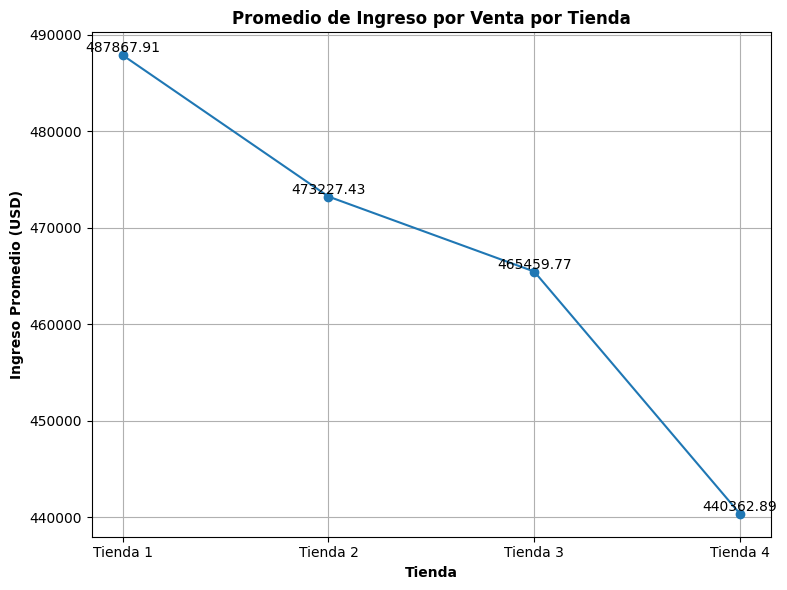

In [ ]:
# Calcular el promedio de ingreso por venta para cada tienda
promedio_ingreso_venta_tienda = Tiendas.groupby('Tienda')['Precio'].mean().reset_index()

# Renombrar la columna de promedio de ingreso por venta
promedio_ingreso_venta_tienda.rename(columns={'Precio': 'Promedio de Ingreso por Venta'}, inplace=True)

# Imprimir el promedio de ingreso por venta de cada tienda
print("\nPromedio de ingreso por venta por tienda:")
print(promedio_ingreso_venta_tienda)
print("\n")

# Crear la gráfica de línea
plt.figure(figsize=(8, 6))
plt.plot(promedio_ingreso_venta_tienda['Tienda'], promedio_ingreso_venta_tienda['Promedio de Ingreso por Venta'], marker='o', linestyle='-')

# Agregar etiquetas y título
plt.xlabel('Tienda', fontweight='bold')
plt.ylabel('Ingreso Promedio (USD)', fontweight='bold')
plt.title('Promedio de Ingreso por Venta por Tienda', fontweight='bold')

# Agregar el valor del promedio de ingreso por venta en cada punto de la línea
for index, row in promedio_ingreso_venta_tienda.iterrows():
    plt.text(row['Tienda'], row['Promedio de Ingreso por Venta'], f"{row['Promedio de Ingreso por Venta']:.2f}", ha='center', va='bottom')

# Mostrar resultado
plt.tight_layout()
plt.grid(True)
plt.show()

**CONCLUSION**

🔎 La Tienda 4 también tiene el ingreso promedio por venta más bajo, lo que indica menor rentabilidad por transacción.

# ✅ Conclusión y Recomendación

Tras analizar todos los factores presentados y evaluar las visualizaciones correspondientes, se recomienda vender la Tienda 4.

**Justificación de la decisión:**

**Criterio** -------------------------------------- **Tienda 4 (Desempeño)**

Facturación Total	--------------------------- ❌ La más baja

Ingreso Promedio por Venta -----------❌ El menor

Participación por Categoría	------------❌ No lidera en ninguna

Calificación del Cliente --------------------⚠️ Intermedia

Productos Vendidos ------------------------⚠️ Poca rotación de costosos

Costo de Envío -------------------------------- ✅ El más bajo

🔔 Aunque Tienda 4 muestra un costo logístico menor, sus debilidades en facturación, rentabilidad, posicionamiento de productos y participación en categorías clave justifican su venta. Por tanto, esta es la tienda menos eficiente dentro del grupo de tiendad.

***Por lo tanto, la venta de la Tienda 4 permitiría al Sr. Juan recuperar capital sin comprometer la eficiencia global de la cadena, y así destinar esos recursos al nuevo emprendimiento con mayor proyección.***

#⚡EXTRA

##**🌍 Análisis** del desempeño geográfico

In [119]:
# Desafío:
# Utilice los datos de latitud (lat) y longitud (lon) para mapear las ventas de cada tienda y analizar la distribución geográfica de los productos vendidos.
# Genere gráficos de dispersión o mapas de calor (Heatmaps) para visualizar datos e identificar áreas con la mayor concentración de ventas.
# Explore si algunas tiendas tienen un rendimiento superior o inferior al esperado en determinadas regiones e identifique si existen patrones geográficos que puedan influir en el rendimiento de las tiendas.

import folium

# Crear un mapa base centrado en la ubicación promedio de todas las tiendas
latitud = Tiendas['lat'].mean()
longitud = Tiendas['lon'].mean()
m = folium.Map(location=[latitud, longitud], zoom_start=4)

# Añadir marcadores para cada tienda
for index, row in Tiendas.iterrows():
    folium.Marker([row['lat'], row['lon']], popup=f"Tienda {row['Tienda']}\nVenta: ${row['Precio']:.2f}").add_to(m)

# Visualizacion de la distribución de ventas usando un mapa de calor
from folium.plugins import HeatMap

# Preparar los datos para el mapa de calor (lista de listas con [latitud, longitud, intensidad])
# Usar 'Precio' como intensidad para el mapa de calor
heatmap_data = Tiendas[['lat', 'lon', 'Precio']].values.tolist()

# Añadir la capa de mapa de calor al mapa
HeatMap(heatmap_data).add_to(m)

# Mostrar el mapa
m